In [1]:
#!pip install statistical_clear_sky

In [2]:
# go to mosek.com and enroll in trial, follow instructions and place license file in specified location
# !pip install Mosek

In [3]:
import mosek
import pandas as pd
from statistical_clear_sky import IterativeFitting
from solardatatools import DataHandler
from utils import get_data
import matplotlib.pyplot as plt

In [4]:
df = pd.read_csv('garage_data.csv')
del df['date.1']

In [5]:
def prep(df):
    # Run once
    df['date'] = pd.to_datetime(df['date'])
    df.index = df['date']
    df.index = df['date'].dt.floor('h')
    del df['date']
    df = df[~df.index.duplicated()]
    df = df.asfreq(freq='15Min')
    cols = df.columns.tolist()
    df[cols] = df[cols].interpolate(method='linear')
    return df

def handler(column='C_percent_full'):
    # Run for each column of interest separately
    dh = DataHandler(df)
    dh.run_pipeline(power_col=column)
    dh.report()
    return dh

def fitter(dh):
    scsf = IterativeFitting(data_handler_obj=dh)
    scsf.execute()
    dh.fit_statistical_clear_sky_model()
    dh.find_clear_times()
    return scsf, dh

In [6]:
# Prep and Fit all data

df = prep(df)

objs = []
garages = ['A','B','C','D','H','I','Libra']
for g in garages:
    print('*'*40)
    print(g)
    dh = handler(column=f'{g}_percent_full')
    scsf,dh = fitter(dh)
    objs.append([g,scsf,dh])

 - Objective: 5.451e+03, f1: 3.673e+03, f2: 7.647e+01, f3: 1.702e+03, f4: 1.033e-09
Caution: residuals increased
Caution: objective increased.
    Minimizing left matrix
    Minimizing right matrix
8 - Objective: 5.526e+03, f1: 3.657e+03, f2: 7.931e+01, f3: 1.790e+03, f4: 1.396e-09
Caution: residuals increased
Caution: objective increased.
    Minimizing left matrix
    Minimizing right matrix
9 - Objective: 5.587e+03, f1: 3.634e+03, f2: 8.321e+01, f3: 1.870e+03, f4: 2.156e-09
Caution: residuals increased
Caution: objective increased.
    Minimizing left matrix
    Minimizing right matrix
10 - Objective: 5.639e+03, f1: 3.615e+03, f2: 8.536e+01, f3: 1.939e+03, f4: 3.109e-09
Caution: residuals increased
Caution: objective increased.
Reached iteration limit. Previous improvement: 0.94%
Minimization complete in 0.47 minutes
****************************************
D
Done.
Restarting the pipeline...
Done.
Restarting the pipeline...
Done.
Restarting the pipeline...
total time: 7.79 seconds
-

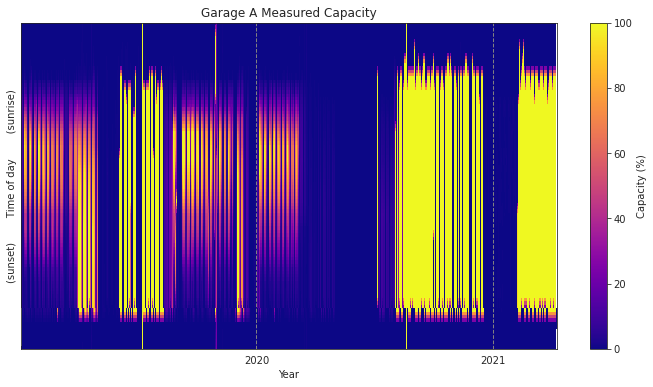

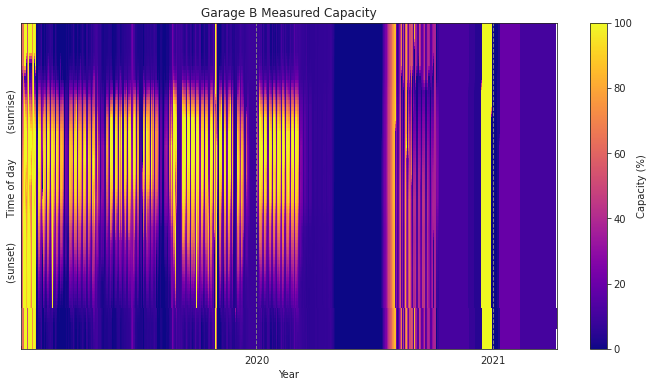

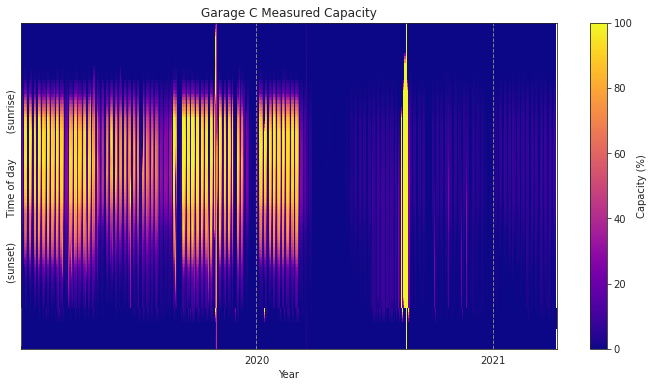

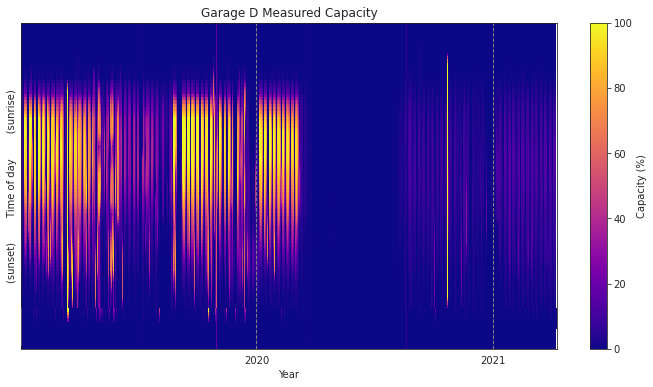

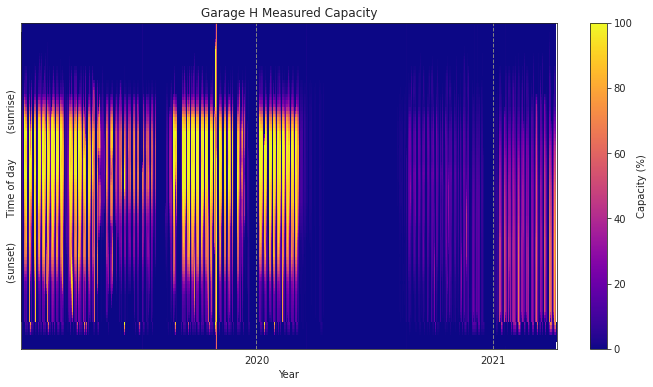

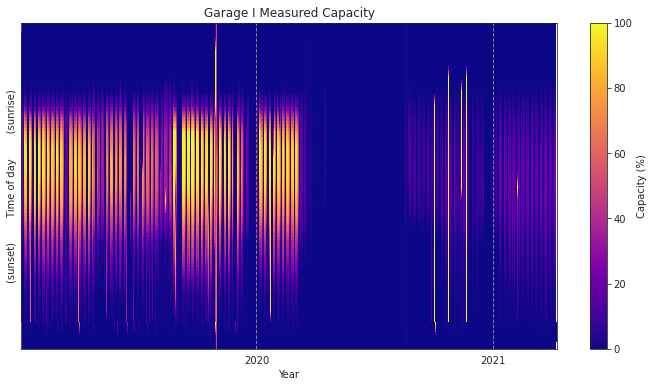

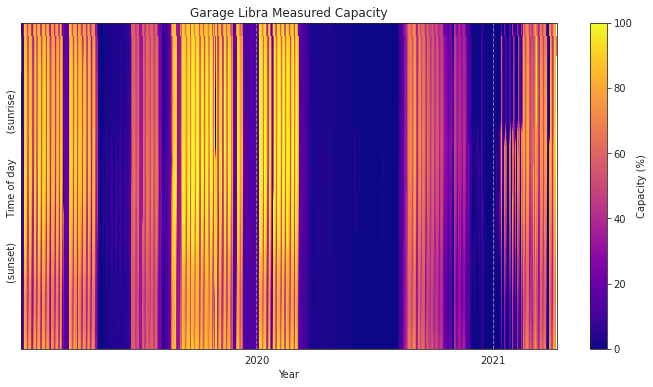

In [7]:
# Visualize heatmap

for g,scsf,dh in objs:
    fig = dh.plot_heatmap(matrix='raw')
    plt.title(f"Garage {g} Measured Capacity")
    plt.show()

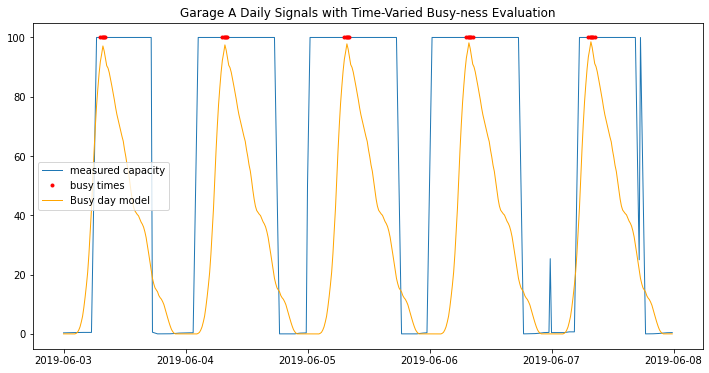

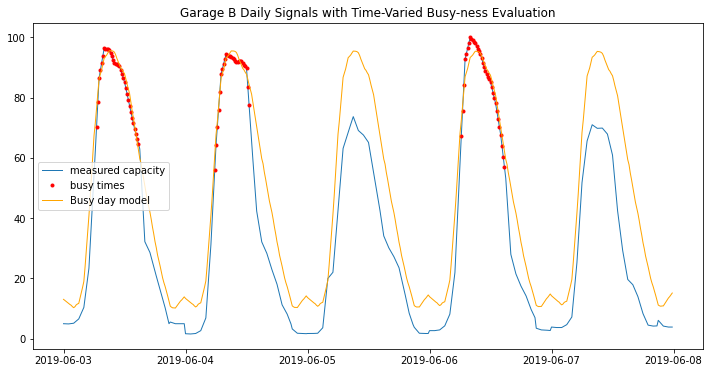

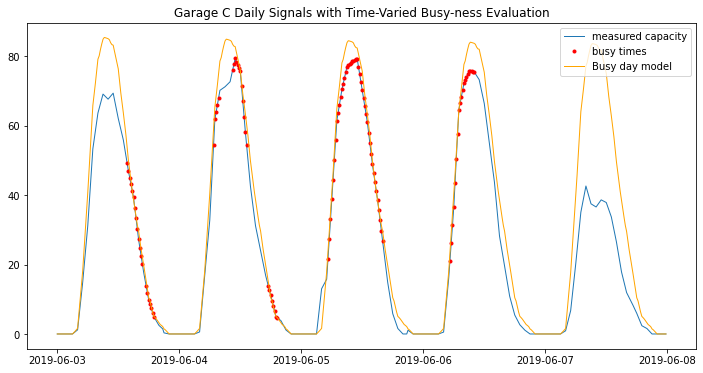

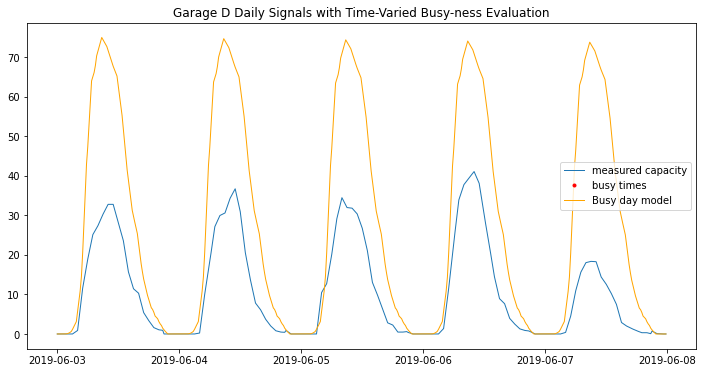

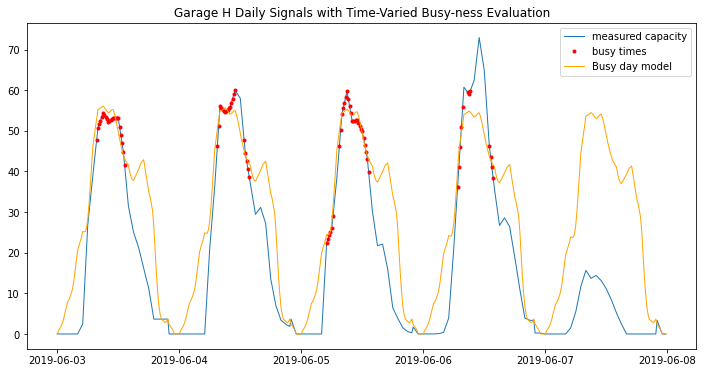

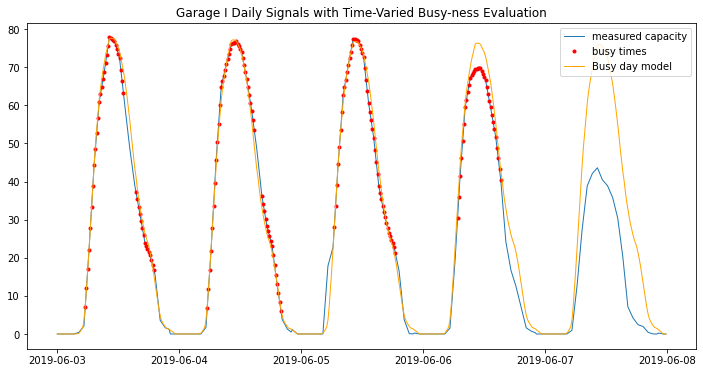

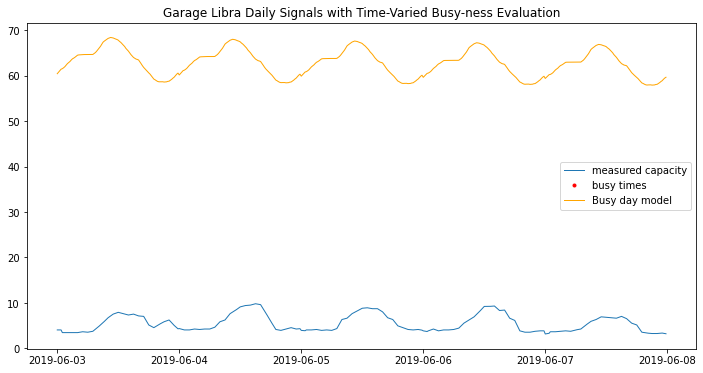

In [8]:
for g,scsf,dh in objs:
    dh.plot_daily_signals(start_day=152, boolean_mask=dh.boolean_masks.clear_times, mask_label='busy times',show_legend=True)
    plt.title(f'Garage {g} Daily Signals with Time-Varied Busy-ness Evaluation')

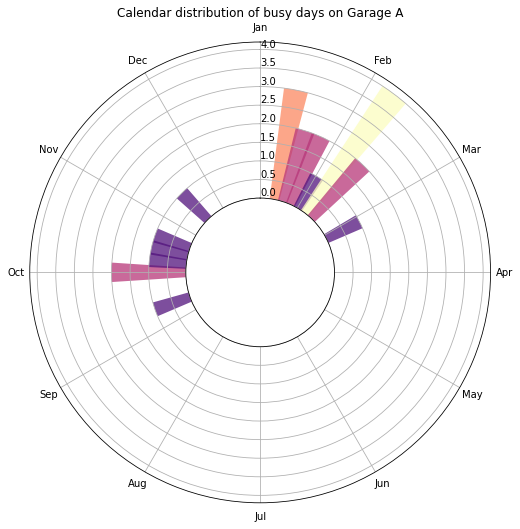

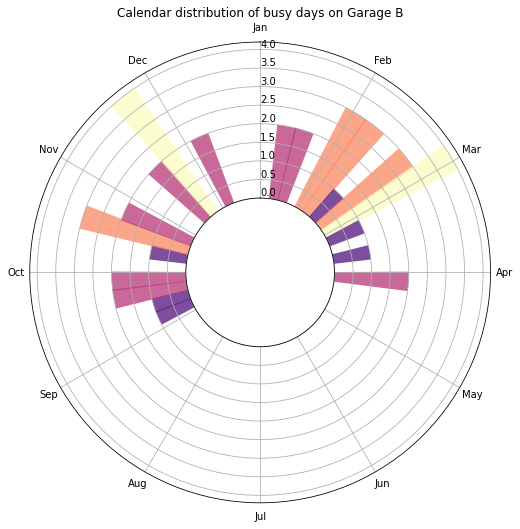

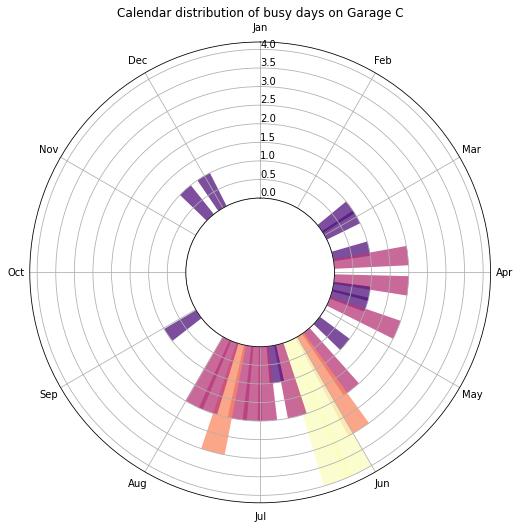

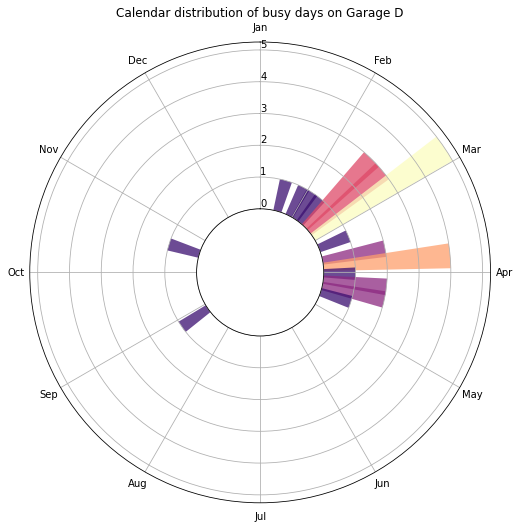

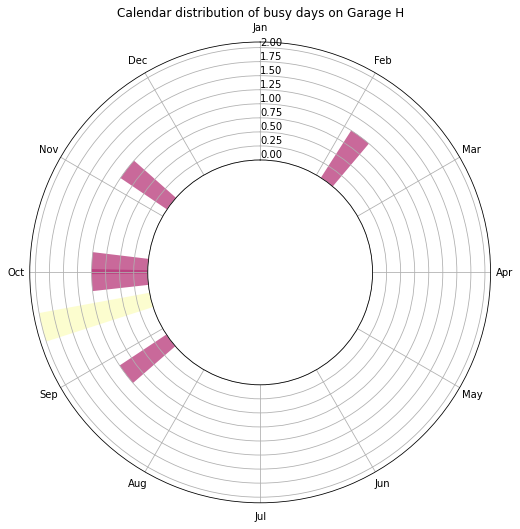

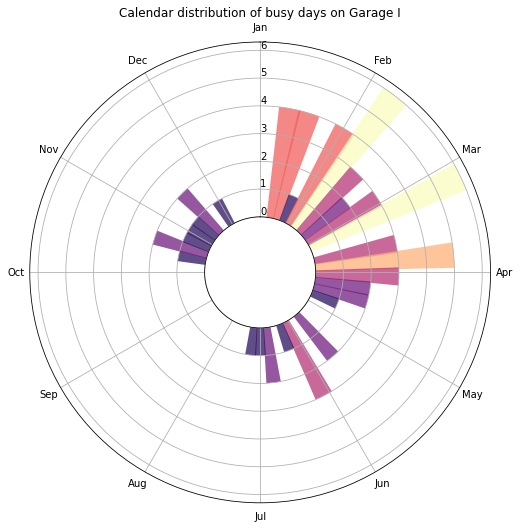

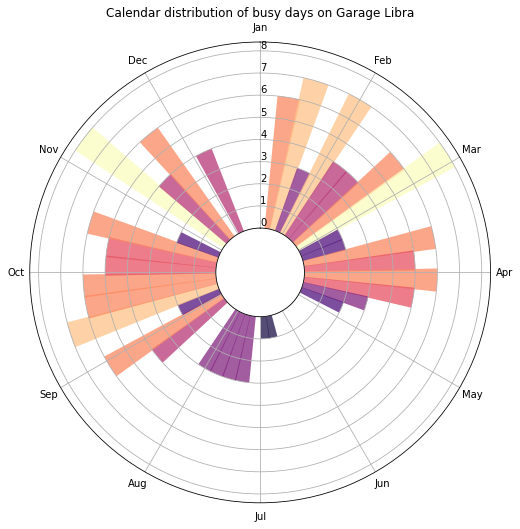

In [9]:
# TODO: Estimate at time X:XX given few points about day
for g,scsf,dh in objs:
    dh.plot_circ_dist(flag='clear');
    plt.title(f'Calendar distribution of busy days on Garage {g}')
    # plt.savefig(f'figs//busyPie_{g}.png')

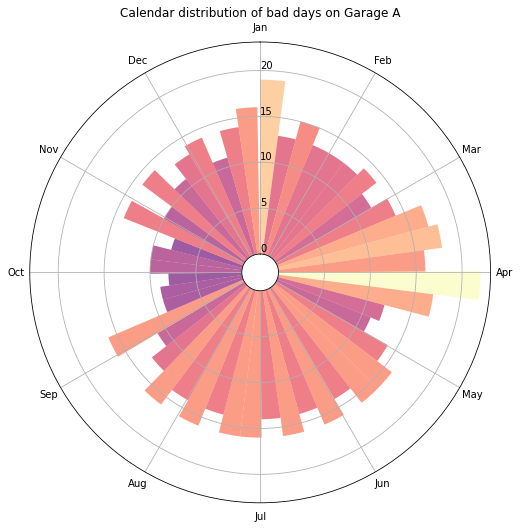

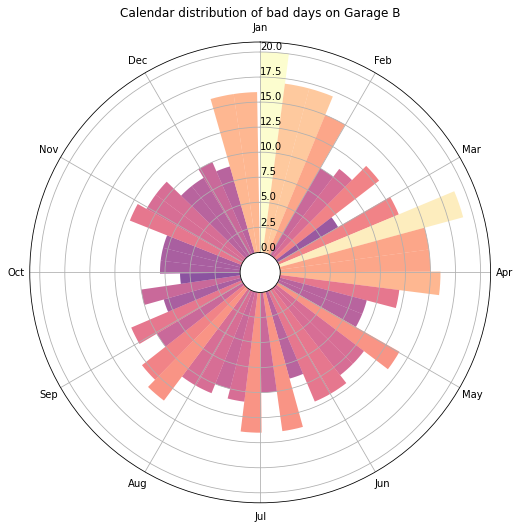

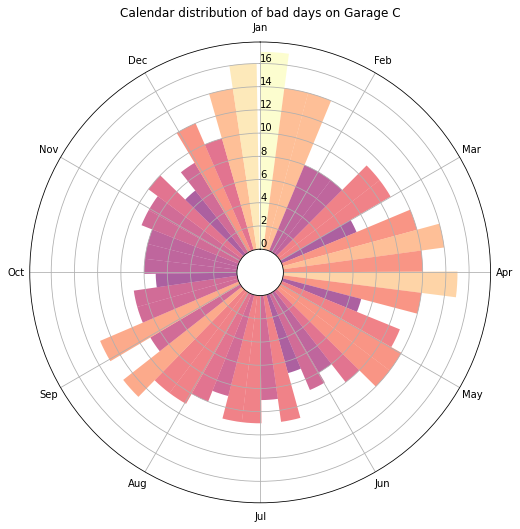

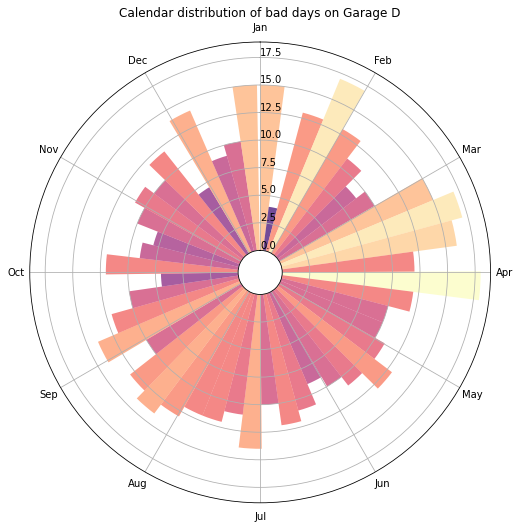

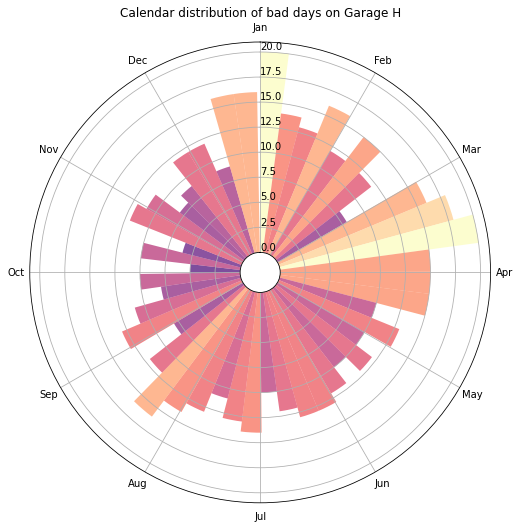

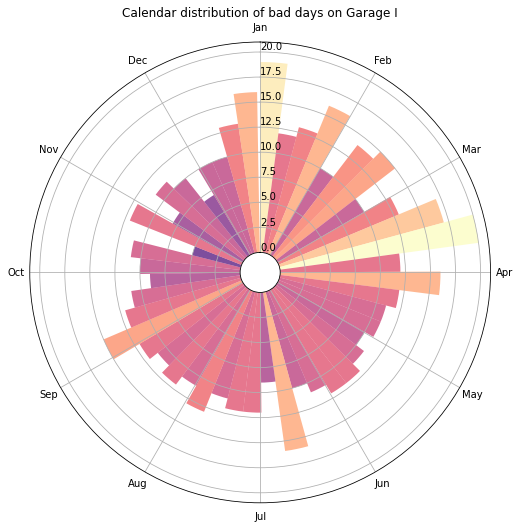

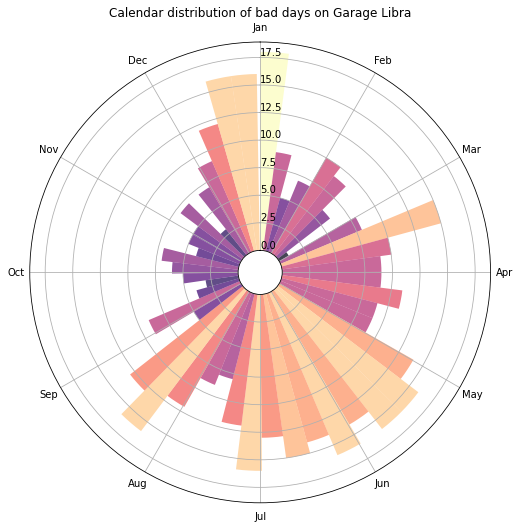

In [10]:
for g,scsf,dh in objs:
    dh.plot_circ_dist(flag='bad');
    plt.title(f'Calendar distribution of bad days on Garage {g}')
    # plt.savefig(f'figs//badPie_{g}.png')

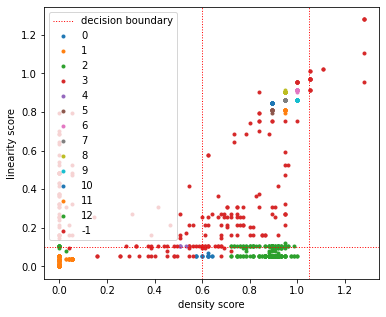

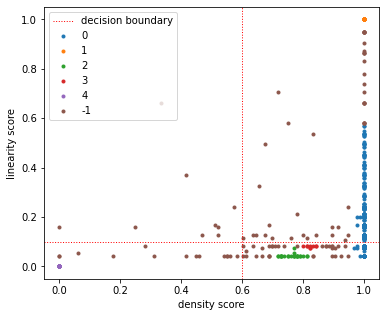

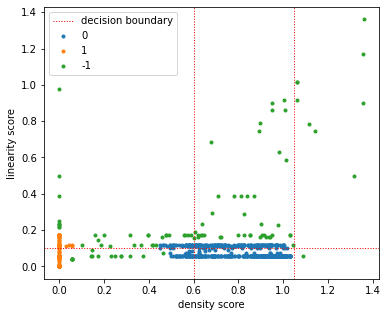

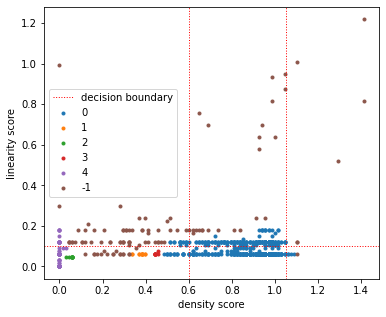

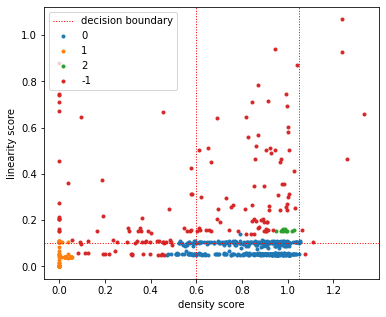

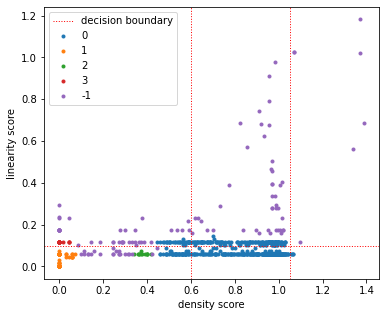

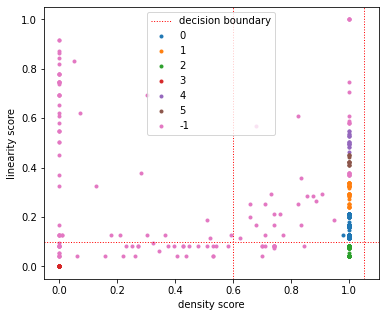

In [11]:
for g,scsf,dh in objs:
    dh.plot_data_quality_scatter();

830
830
830
830
830
830
830


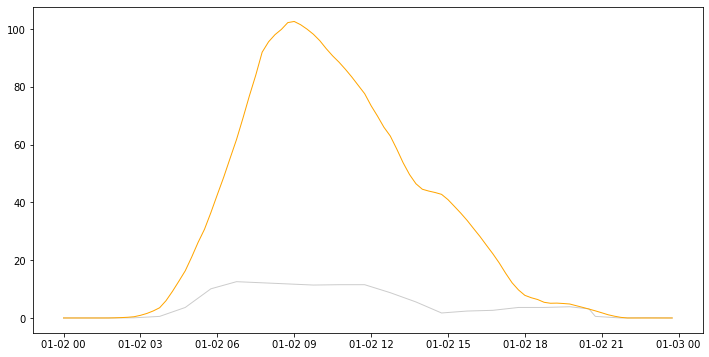

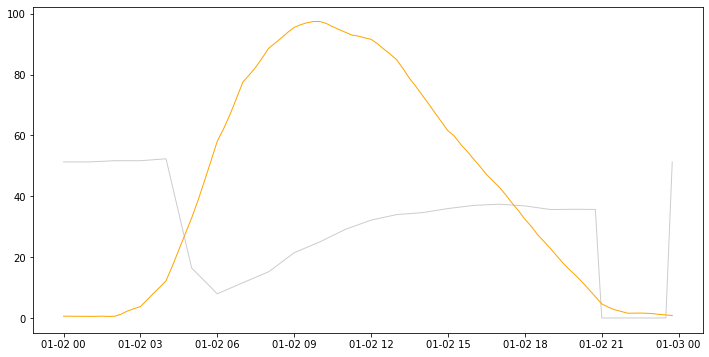

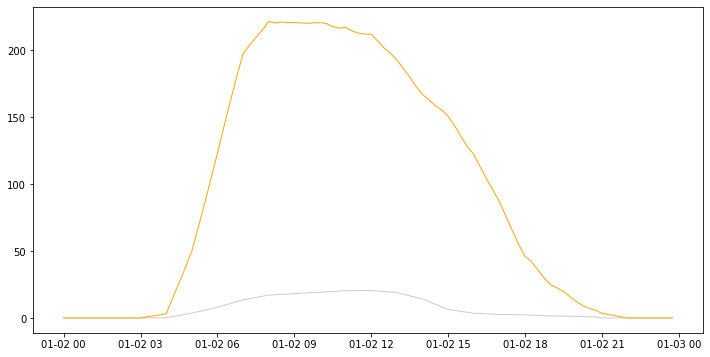

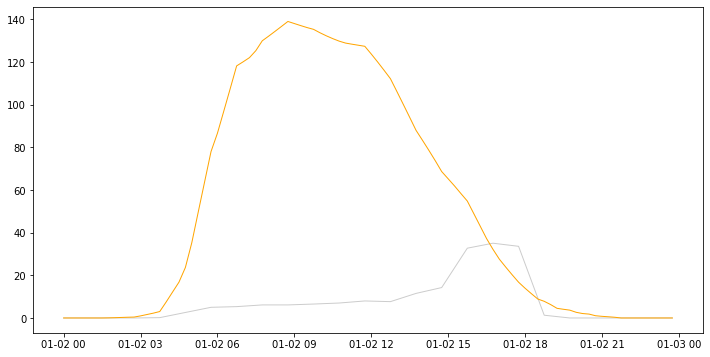

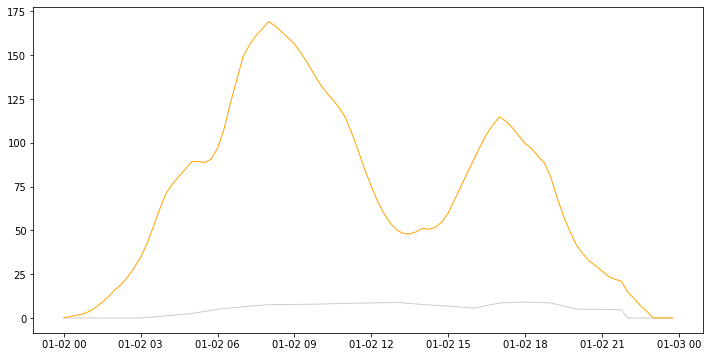

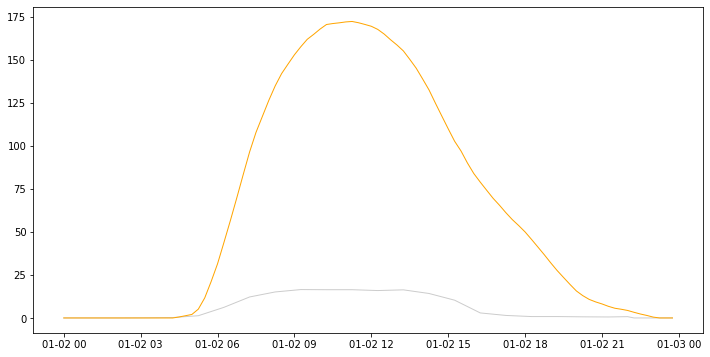

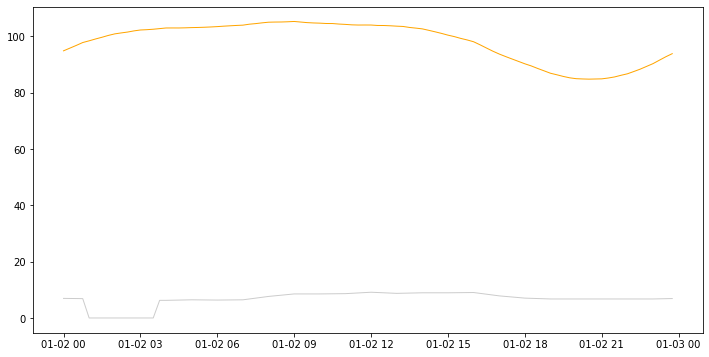

In [12]:
import numpy as np
ndays=1
for g,scsf,dh in objs:
    #bix = np.array(list(dh.daily_flags.clear)*ndays)
    bix = dh.daily_flags.density
    print(len(bix))
    dh.plot_daily_signals(boolean_index=bix, start_day=0, num_days=ndays, ravel=False, color='black', alpha=0.2);

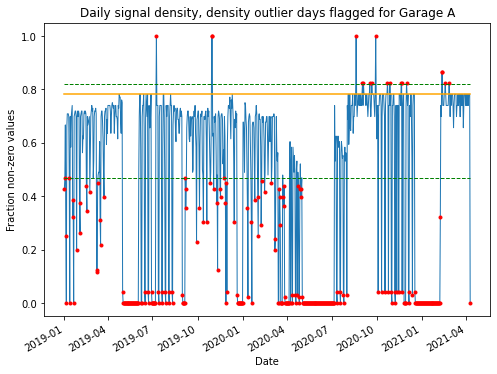

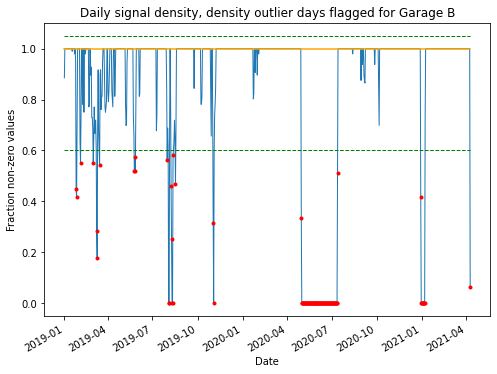

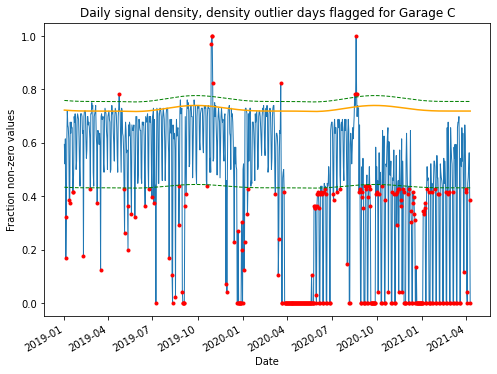

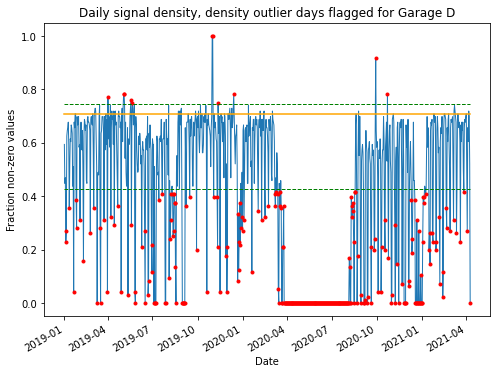

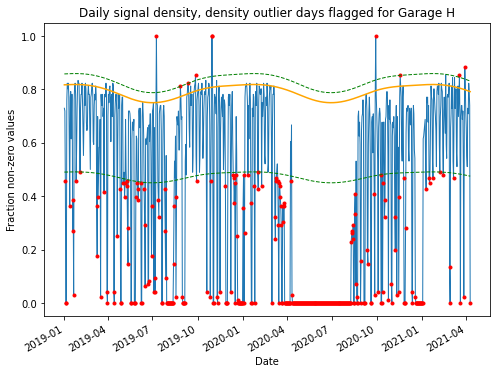

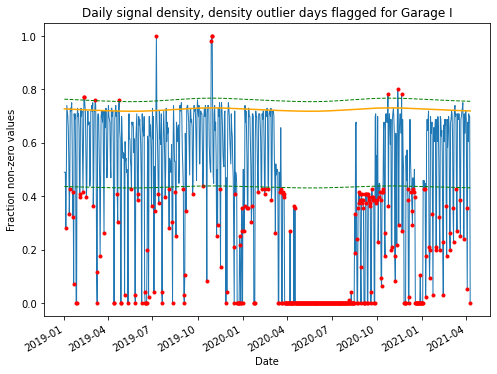

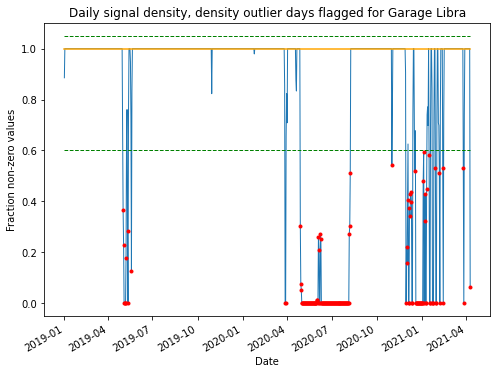

In [13]:
for g,scsf,dh in objs:
    dh.plot_density_signal(show_fit=True, flag='density');
    plt.title(f'Daily signal density, density outlier days flagged for Garage {g}')
    plt.savefig(f'figs//prepOutlier_{g}.png')

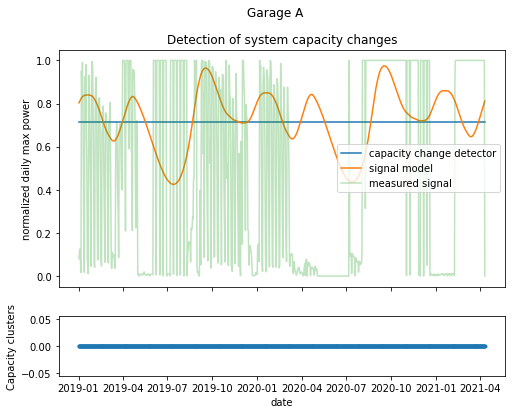

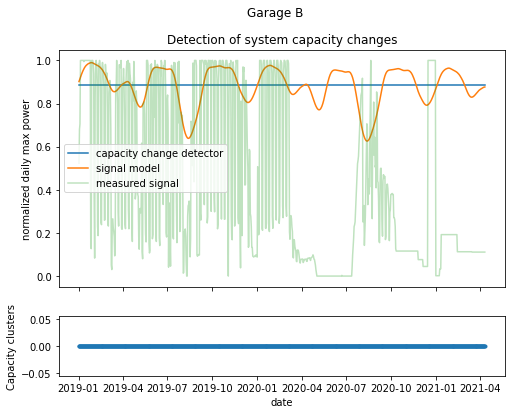

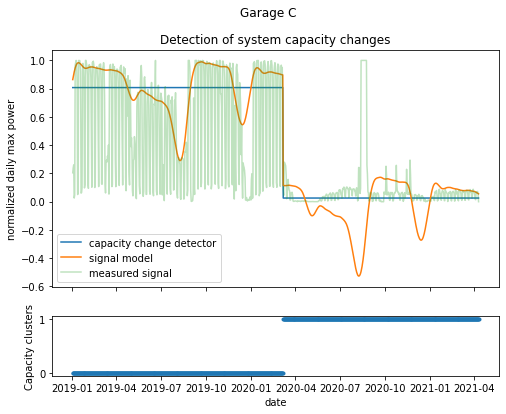

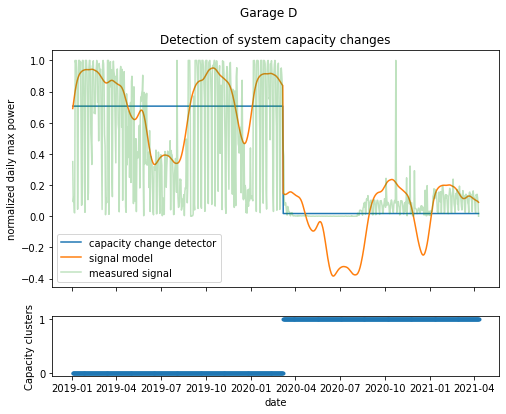

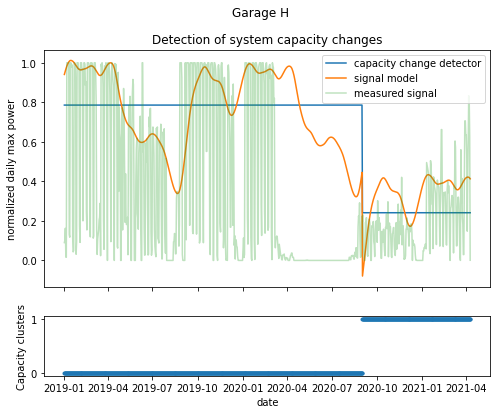

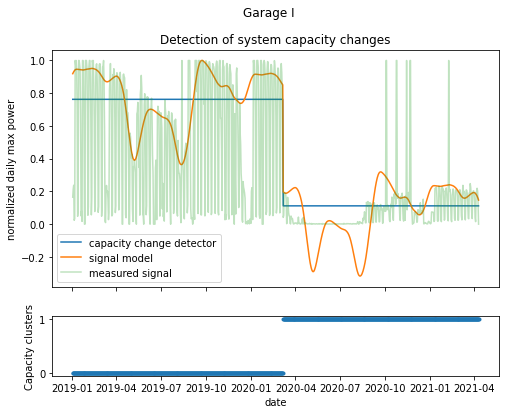

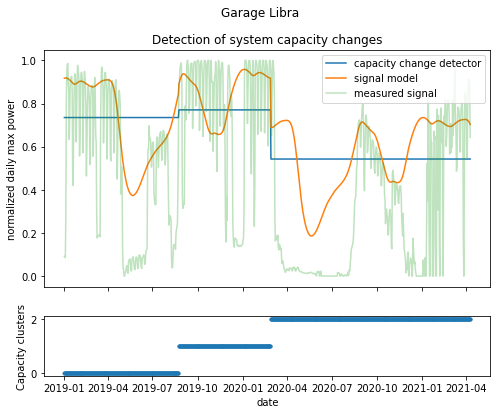

In [14]:
for g,scsf,dh in objs:
    dh.plot_capacity_change_analysis()
    plt.suptitle(f'Garage {g}')
    # plt.savefig(f'figs//changeDetection_{g}.png')

Text(0.5, 1.0, 'Distribution of normalized daily maximum values for Garage Libra')

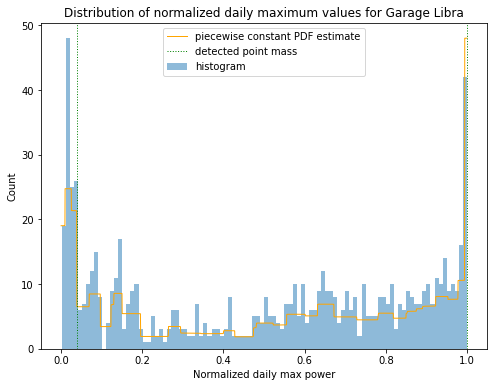

In [15]:
dh.plot_daily_max_pdf()
plt.title(f'Distribution of normalized daily maximum values for Garage {g}')

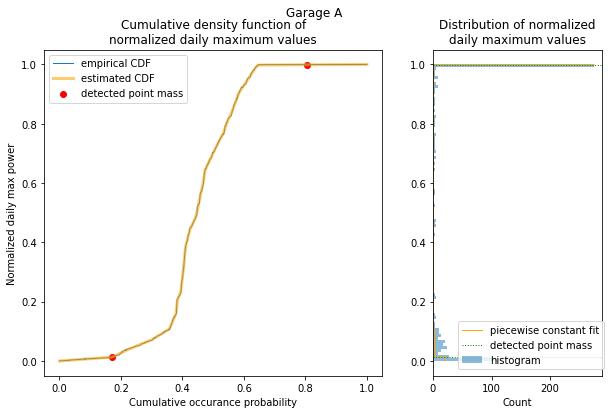

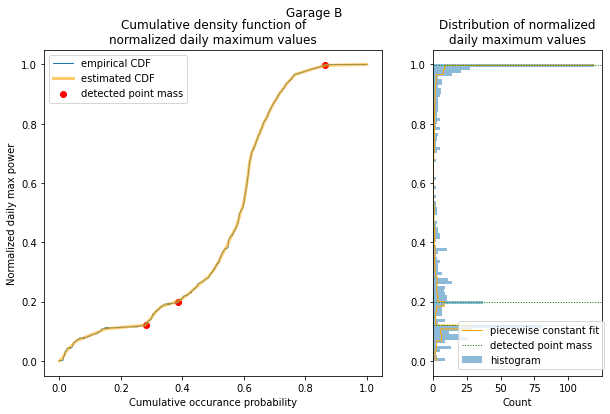

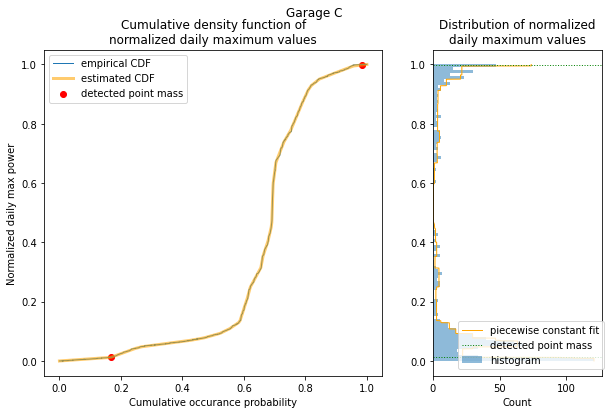

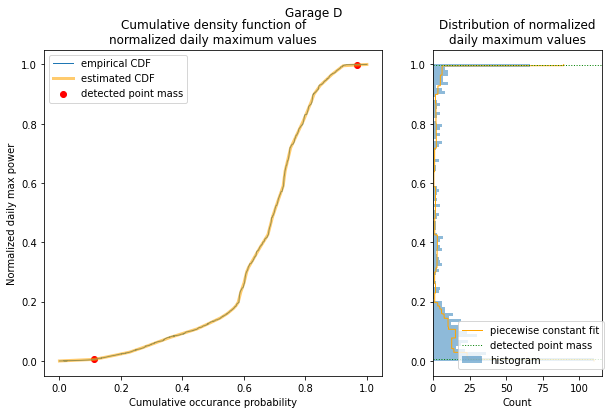

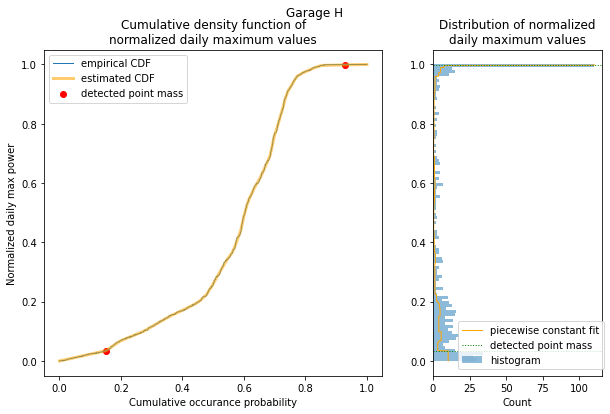

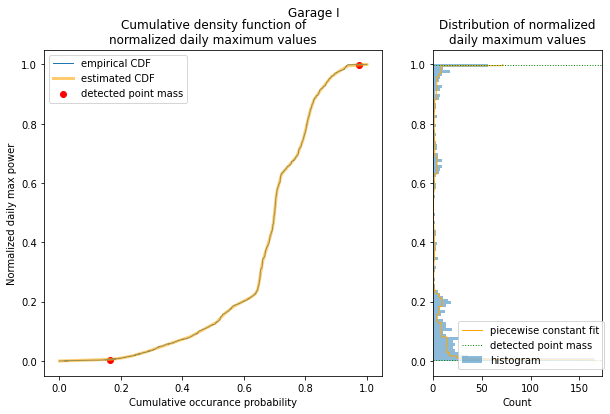

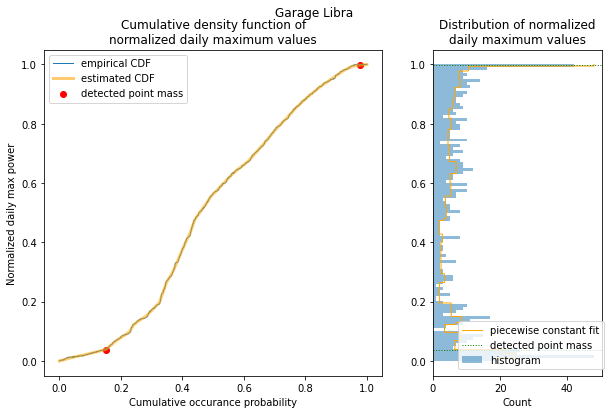

In [16]:
for g,scsf,dh in objs:
    dh.plot_daily_max_cdf_and_pdf()
    plt.suptitle(f"Garage {g}")

In [38]:
#adapted_objs = objs
print(len(objs[0]))
for idx,(g,scsf,dh) in enumerate(adapted_objs):
    data_preCovid = dh.raw_data_matrix.T[0:365]
    filter_preCovid = dh.daily_signals.density[0:365]
    data_preCovid -= scsf.estimated_power_matrix.T[0:365]

    busyness = dh.boolean_masks.clear_times[0:365]
    data = np.array([x for x,b in zip(data_preCovid, filter_preCovid)])# if b])
    busy_data = np.array([x for x,b in zip(busyness, filter_preCovid)])# if b])
    adapted_objs[idx].append(data)
    adapted_objs[idx].append(busy_data)

    data_postCovid = dh.raw_data_matrix.T[365:400]
    adapted_objs[idx].append(data_postCovid)

    print(g, data.shape)

6
A (365, 96)
B (365, 96)
C (365, 96)
D (365, 96)
H (365, 96)
I (365, 96)
Libra (365, 96)


In [37]:
adapted__objs = []
for idx,blah in enumerate(adapted_objs):
    print(len(blah))
    adapted__objs.append(objs[idx][0:3])
adapted_objs = adapted__objs

6
6
6
6
6
6
6


In [39]:
# True in busys[44:56]
#ys = np.asarray([np.array([(d>0.99) for d in data]) ])

input_data_time_end = 44 #11am
output_data_time = 60 #48 #noon

input_samples = []
output_samples = []

test_input_samples = []
test_output_samples = []

for g,scsf,dh,data,busy_data,test_data in adapted_objs:
    inp = data.T[output_data_time] > 0.99
    input_samples.append(inp)
    out = data.T[0:input_data_time_end].T
    output_samples.append(out)

    test_inp = test_data.T[output_data_time] > 0.99
    test_input_samples.append(test_inp)
    test_out = test_data.T[0:input_data_time_end].T
    test_output_samples.append(test_out)

input_samples = np.asarray(input_samples).T
output_samples = np.asarray(output_samples)
output_samples = output_samples.reshape(output_samples.shape[1], output_samples.shape[0]*output_samples.shape[2])

test_input_samples = np.asarray(test_input_samples).T
test_output_samples = np.asarray(test_output_samples)
test_output_samples = test_output_samples.reshape(test_output_samples.shape[1], test_output_samples.shape[0]*test_output_samples.shape[2])

input_samples.shape, output_samples.shape, test_input_samples.shape, test_output_samples.shape

((365, 7), (365, 308), (35, 7), (35, 308))

In [58]:

bs = []
for input_sample in input_samples:
    print(input_sample)
    bs.append(sum(True == input_sample)>2)
pd.Series(bs).value_counts()

[False False False False False False False]
[False False False False False False False]
[False  True False False False False False]
[False  True False False False False False]
[False  True False False False False False]
[False  True False False  True False False]
[ True  True False False  True False False]
[False  True False False False False False]
[False  True False False  True False False]
[False False False False False False False]
[False  True False False False False False]
[False  True False False False False False]
[False  True False False  True False False]
[False  True False False  True False False]
[False  True False False False False False]
[False  True False False  True False False]
[False  True False False False False False]
[False  True False False False False False]
[False  True False False False False False]
[False  True False False False False False]
[ True  True False False  True False False]
[False  True False False  True False False]
[False  True False False  True F

False    308
True      57
dtype: int64

In [40]:
from keras.models import Sequential
from keras.layers import Dense,Dropout
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

def model():
    model = Sequential()
    model.add(Dense(50, input_dim=output_samples[0].shape[0], activation='relu'))
    model.add(Dropout(0.35))
    model.add(Dense(15, activation='relu'))
    model.add(Dense(len(input_samples[0]), activation='sigmoid'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

estimator = KerasRegressor(build_fn=model, epochs=100, batch_size=5, verbose=1)
kfold = KFold(n_splits=5)
results = cross_val_score(estimator, output_samples, input_samples, cv=kfold)
print("Baseline: %.2f (%.2f) MSE" % (results.mean(), results.std()))

step - loss: 0.1388
Epoch 57/100
59/59 [==============================] - 0s 4ms/step - loss: 0.1325
Epoch 58/100
59/59 [==============================] - 0s 3ms/step - loss: 0.1334
Epoch 59/100
59/59 [==============================] - 0s 4ms/step - loss: 0.1312
Epoch 60/100
59/59 [==============================] - 0s 4ms/step - loss: 0.1349
Epoch 61/100
59/59 [==============================] - 0s 4ms/step - loss: 0.1318
Epoch 62/100
59/59 [==============================] - 0s 3ms/step - loss: 0.1430
Epoch 63/100
59/59 [==============================] - 0s 3ms/step - loss: 0.1445
Epoch 64/100
59/59 [==============================] - 0s 4ms/step - loss: 0.1287
Epoch 65/100
59/59 [==============================] - 0s 3ms/step - loss: 0.1436
Epoch 66/100
59/59 [==============================] - 0s 4ms/step - loss: 0.1306
Epoch 67/100
59/59 [==============================] - 0s 4ms/step - loss: 0.1399
Epoch 68/100
59/59 [==============================] - 0s 4ms/step - loss: 0.1460
Epoch 69

In [59]:
# input_samples.shape, output_samples.shape, test_input_samples.shape, test_output_samples.shape
estimator.fit(output_samples, input_samples)
prediction = estimator.predict(output_samples)

Epoch 1/100
73/73 [==============================] - 0s 3ms/step - loss: 0.3456
Epoch 2/100
73/73 [==============================] - 0s 3ms/step - loss: 0.2322
Epoch 3/100
73/73 [==============================] - 0s 3ms/step - loss: 0.2152
Epoch 4/100
73/73 [==============================] - 0s 3ms/step - loss: 0.2009
Epoch 5/100
73/73 [==============================] - 0s 3ms/step - loss: 0.1819
Epoch 6/100
73/73 [==============================] - 0s 3ms/step - loss: 0.1766
Epoch 7/100
73/73 [==============================] - 0s 2ms/step - loss: 0.1646
Epoch 8/100
73/73 [==============================] - 0s 3ms/step - loss: 0.1532
Epoch 9/100
73/73 [==============================] - 0s 3ms/step - loss: 0.1422
Epoch 10/100
73/73 [==============================] - 0s 2ms/step - loss: 0.1351
Epoch 11/100
73/73 [==============================] - 0s 2ms/step - loss: 0.1400
Epoch 12/100
73/73 [==============================] - 0s 3ms/step - loss: 0.1398
Epoch 13/100
73/73 [=================

mae 0.26601866
r2 -6.3848431684261035e-06
mse 0.13275594


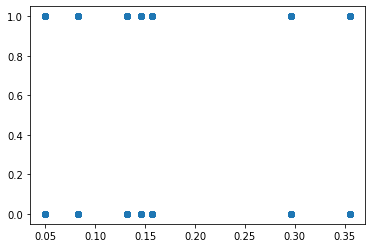

In [60]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
print('mae',mean_absolute_error(input_samples, prediction))
print('r2',r2_score(input_samples, prediction))
print('mse',mean_squared_error(input_samples, prediction))
plt.scatter(prediction, input_samples)

In [50]:
input_samples
#prediction

array([[ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True, False,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True],
       [ True,